# Pr-Tmax cross-correlation

Assessment of model Pr-Tmax monthly anomalies cross-correlation 

In [1]:
import warnings
warnings.filterwarnings('ignore')

import sys
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cmocean
import cartopy.crs as ccrs
import seaborn as sns
from scipy import stats

from xskillscore import pearson_r, pearson_r_p_value


sys.path.append('/g/data/xv83/users/at2708/bias_adjustment/evaluation/npcp/results')
import utils

In [2]:
def calc_pt_corr(da_p, da_t):
    """Calculate the monthly anomalies for Pr and Tasmax"""
        
    precip_clim = (da_p.groupby("time.month").mean(dim="time"))
    anom_p = da_p.groupby("time.month") - precip_clim

    tmax_clim = (da_t.groupby("time.month").mean(dim="time"))
    anom_t = da_t.groupby("time.month") - tmax_clim

    return anom_p, anom_t 

In [3]:
def get_data(gcm, rcm, task):
    """Get data needed for the evaluation"""

    assert gcm in ['ECMWF-ERA5', 'CSIRO-ACCESS-ESM1-5']
    assert rcm in ['BOM-BARPA-R', 'CSIRO-CCAM-2203', 'UQ-DES-CCAM-2105']
    assert task in ['historical', 'xvalidation']

    if gcm == 'ECMWF-ERA5':
        start_date = '2000-01-01' if task == 'xvalidation' else '1980-01-01'
    else:
        start_date = '1990-01-01' if task == 'xvalidation' else '1980-01-01' 
    end_date = '2019-12-31'
    
    da_dict = {}
    
    da_dict['obs_p'] = utils.get_npcp_data(
        'pr',
        'observations',
        'AGCD',
        'raw',
        'task-reference',
        start_date,
        end_date,
        'AU'
    )

    da_dict['obs_t'] = utils.get_npcp_data(
        'tasmax',
        'observations',
        'AGCD',
        'raw',
        'task-reference',
        start_date,
        end_date,
        'AU'
    )
   
    da_dict['gcm_p'] = utils.get_npcp_data(
        'pr',
        gcm,
        'GCM',
        'raw',
        'task-reference',
        start_date,
        end_date,
        'AU'
    )

    da_dict['gcm_t'] = utils.get_npcp_data(
        'tasmax',
        gcm,
        'GCM',
        'raw',
        'task-reference',
        start_date,
        end_date,
        'AU'
    )
    
    da_dict['rcm_raw_p'] = utils.get_npcp_data(
        'pr',
        gcm,
        rcm,
        'raw',
        'task-reference',
        start_date,
        end_date,
        'AU'
    )

    da_dict['rcm_raw_t'] = utils.get_npcp_data(
        'tasmax',
        gcm,
        rcm,
        'raw',
        'task-reference',
        start_date,
        end_date,
        'AU'
    )
    
    da_dict['rcm_ecdfm_p'] = utils.get_npcp_data(
        'pr',
        gcm,
        rcm,
        'ecdfm',
        f'task-{task}',
        start_date,
        end_date,
        'AU'
    )

    da_dict['rcm_ecdfm_t'] = utils.get_npcp_data(
        'tasmax',
        gcm,
        rcm,
        'ecdfm',
        f'task-{task}',
        start_date,
        end_date,
        'AU'
    )


    da_dict['rcm_qme_p'] = utils.get_npcp_data(
        'pr',
        gcm,
        rcm,
        'qme',
        f'task-{task}',
        start_date,
        end_date,
        'AU'
    )

    da_dict['rcm_qme_t'] = utils.get_npcp_data(
        'tasmax',
        gcm,
        rcm,
        'qme',
        f'task-{task}',
        start_date,
        end_date,
        'AU'
    )
    if task == 'xvalidation':
        da_dict['rcm_qdm_p'] = utils.get_npcp_data(
            'pr',
            gcm,
            rcm,
            'qdm',
            f'task-{task}',
            start_date,
            end_date,
            'AU'
        )
        da_dict['rcm_qdm_t'] = utils.get_npcp_data(
            'tasmax',
            gcm,
            rcm,
            'qdm',
            f'task-{task}',
            start_date,
            end_date,
            'AU'
        )
    # TODO: Add additional bias correction methods as data becomes available 

    return da_dict

In [4]:
def plot_mean_bias(ax, da_obs_p, da_obs_t, da_model_p, da_model_t, cmap, levels, model_name, month, ob_fractions=None):
    """Plot the mean bias for a particular model"""

    if 'UQ-DES-CCAM-2105 (raw)' in model_name or 'UQ-DES-CCAM-2105 (ecdfm)' in model_name:
        da_obs_t = da_obs_t.sel(time=~((da_obs_t.time.dt.month == 2) & (da_obs_t.time.dt.day == 29)))
        da_obs_p = da_obs_p.sel(time=~((da_obs_p.time.dt.month == 2) & (da_obs_p.time.dt.day == 29)))

    def calc_corr(da_p,da_t,month):
        da_p = utils.clip_data(da_p, utils.get_aus_shape())
        da_t = utils.clip_data(da_t, utils.get_aus_shape())
        if ob_fractions is not None:
            da_p = utils.mask_by_pr_ob_fraction(da_p, ob_fractions, threshold=0.9) 
            da_t = utils.mask_by_pr_ob_fraction(da_t, ob_fractions, threshold=0.9) 
        anom_p, anom_t = calc_pt_corr(da_p, da_t)
        
        month_idxs_t=anom_t.groupby('time.month').groups
        month_idxs_p=anom_p.groupby('time.month').groups        
           
        if month == 'jan':
            x_data = anom_t.isel(time=month_idxs_t[1])
            y_data  =anom_p.isel(time=month_idxs_p[1])
        elif month == 'feb':
            x_data = anom_t.isel(time=month_idxs_t[2])
            y_data  =anom_p.isel(time=month_idxs_p[2])
        elif month == 'mar':
            x_data = anom_t.isel(time=month_idxs_t[3])
            y_data  =anom_p.isel(time=month_idxs_p[3])
        elif month == 'apr':
            x_data = anom_t.isel(time=month_idxs_t[4])
            y_data  =anom_p.isel(time=month_idxs_p[4])
        elif month == 'may':
            x_data = anom_t.isel(time=month_idxs_t[5])
            y_data  =anom_p.isel(time=month_idxs_p[5])
        elif month == 'jun':
            x_data = anom_t.isel(time=month_idxs_t[6])
            y_data  =anom_p.isel(time=month_idxs_p[6])
        elif month == 'jul':
            x_data = anom_t.isel(time=month_idxs_t[7])
            y_data  =anom_p.isel(time=month_idxs_p[7])
        elif month == 'aug':
            x_data = anom_t.isel(time=month_idxs_t[8])
            y_data  =anom_p.isel(time=month_idxs_p[8])
        elif month == 'sep':
            x_data = anom_t.isel(time=month_idxs_t[9])
            y_data  =anom_p.isel(time=month_idxs_p[9])
        elif month == 'oct':
            x_data = anom_t.isel(time=month_idxs_t[10])
            y_data  =anom_p.isel(time=month_idxs_p[10])
        elif month == 'nov':
            x_data = anom_t.isel(time=month_idxs_t[11])
            y_data  =anom_p.isel(time=month_idxs_p[11])
        elif month == 'dec':
            x_data = anom_t.isel(time=month_idxs_t[12])
            y_data  =anom_p.isel(time=month_idxs_p[12])
        else:
            print('Invalid month')
            
        # corr=xr.corr(x_data.where((x_data.notnull()) & y_data.notnull()), y_data.where((x_data.notnull()) & y_data.notnull()), dim='time')
        ## spatial_mean= corr.mean(dim=['lat','lon'])
        x_data=x_data.chunk(dict(time=-1))
        y_data=y_data.chunk(dict(time=-1))

        corr=pearson_r(x_data,y_data,'time')
        return corr

    corr_obs = calc_corr(da_obs_p, da_obs_t, month)
    da_model_p = da_model_p.assign_coords(time=da_obs_p.time)
    da_model_t = da_model_t.assign_coords(time=da_obs_t.time)
    corr_model = calc_corr(da_model_p, da_model_t, month)

    bias = corr_model - corr_obs   
    # bias = utils.clip_data(bias, utils.get_aus_shape())
    # if ob_fractions is not None:
    #     bias = utils.mask_by_pr_ob_fraction(bias, ob_fractions, threshold=0.9)  
    mae = np.nanmean(np.abs(bias))    

    units='Pearson CC'
    im = bias.plot(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap=cmap,
        levels=levels,
        extend='both', 
        add_colorbar=False
    ) #cbar_kwargs={'label': units},
    ax.set_title(model_name)
    ax.coastlines()
    cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.04)
    cbar.ax.tick_params(labelsize=14)  
    cbar.set_label(units, fontsize=14) 
    ax.text(0.02, 0.02, f'MAE: {mae:.2f} {units}', transform=ax.transAxes, fontsize=16)


In [5]:
def plot_comparison(gcm, rcm, task, cmap, levels):
    """Plot the complete comparison"""

    da_dict = get_data(gcm, rcm, task)

    months= ['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']
        
    # if var == 'pr':
    #     ob_fractions = utils.get_pr_weights(gcm, task)
    # else:
    #     ob_fractions = None
    ob_fractions = utils.get_pr_weights(gcm, task)

    ncols = 5 if task == 'xvalidation' else 4   
    rows, cols = len(months), ncols

    fig, axs = plt.subplots(rows, cols, figsize=[7*cols, 6*rows], subplot_kw={'projection': ccrs.PlateCarree()})
    
    for row, month in enumerate(months):

        ax1 = axs[row, 0]
        ax2 = axs[row, 1]
        ax3 = axs[row, 2]
        ax4 = axs[row, 3]
        if task == 'xvalidation':
            ax5 = axs[row, 4]

         # Plot AGCD
        # plot_mean_bias(ax1, da_dict['obs_p'],da_dict['obs_t'], cmap, levels, 'AGCD', month,  ob_fractions=ob_fractions)
        # ax1.set_title(f'AGCD ({month.upper()})', fontsize=16)
        
  
        plot_mean_bias(ax1, da_dict['obs_p'],da_dict['obs_t'], da_dict['gcm_p'],da_dict['gcm_t'], cmap, levels, gcm, month,  ob_fractions=ob_fractions)
        ax1.set_title(f'{gcm} ({month.upper()})', fontsize=16)

    
        plot_mean_bias(ax2, da_dict['obs_p'],da_dict['obs_t'], da_dict['rcm_raw_p'], da_dict['rcm_raw_t'], cmap, levels, f'{rcm} (raw)', month,  ob_fractions=ob_fractions)
        ax2.set_title(f'{rcm} (raw) ({month.upper()})', fontsize=16)

 
        plot_mean_bias(ax3, da_dict['obs_p'],da_dict['obs_t'], da_dict['rcm_ecdfm_p'], da_dict['rcm_ecdfm_t'], cmap, levels, f'{rcm} (ecdfm)', month,  ob_fractions=ob_fractions)
        ax3.set_title(f'{rcm} (ecdfm) ({month.upper()})', fontsize=16)

        plot_mean_bias(ax4, da_dict['obs_p'],da_dict['obs_t'], da_dict['rcm_qme_p'], da_dict['rcm_qme_t'], cmap, levels, f'{rcm} (qme)', month,  ob_fractions=ob_fractions)
        ax4.set_title(f'{rcm} (qme) ({month.upper()})', fontsize=16)

        if task == 'xvalidation':
            plot_mean_bias(ax5, da_dict['obs_p'],da_dict['obs_t'], da_dict['rcm_qdm_p'], da_dict['rcm_qdm_t'], cmap, levels, f'{rcm} (qdm)', month,  ob_fractions=ob_fractions)
            ax5.set_title(f'{rcm} (qdm) ({month.upper()})', fontsize=16)
    
    if gcm == 'ECMWF-ERA5':
        start_year = '2000' if task == 'xvalidation' else '1980'
    else:
        start_year = '1990' if task == 'xvalidation' else '1980'
    
    plt.suptitle(f' Bias of Precip-Tmax cross-correlation of monthly anomalies in {start_year}-2019', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()

    plt.show()

# task-historical
Bias corrected data for the 1980-2019 period, using 1980-2019 as a training period.

In [6]:
levels = np.arange(-0.55, 0.56, 0.1)
cmap = 'RdBu_r'

### ERA5

In [ ]:
plot_comparison('ECMWF-ERA5', 'BOM-BARPA-R', 'historical', cmap, levels)

In [ ]:
plot_comparison('ECMWF-ERA5', 'CSIRO-CCAM-2203', 'historical', cmap, levels)

In [ ]:
plot_comparison('ECMWF-ERA5', 'UQ-DES-CCAM-2105', 'historical', cmap, levels)

### ACCESS-ESM1-5

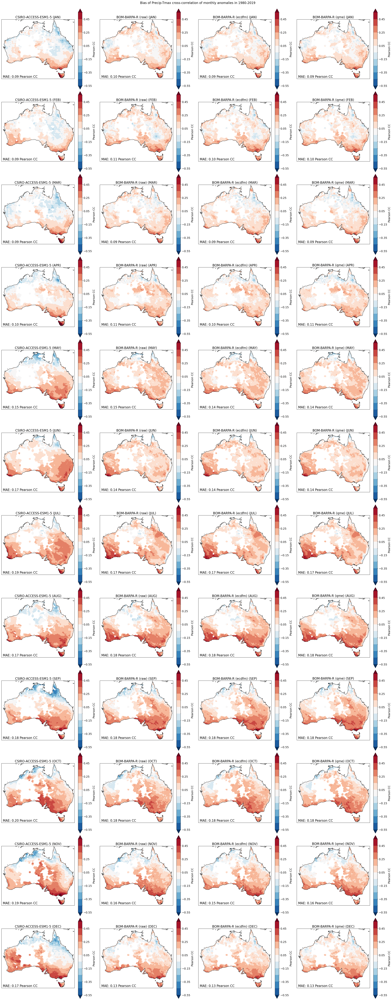

In [14]:
plot_comparison('CSIRO-ACCESS-ESM1-5', 'BOM-BARPA-R', 'historical', cmap, levels)

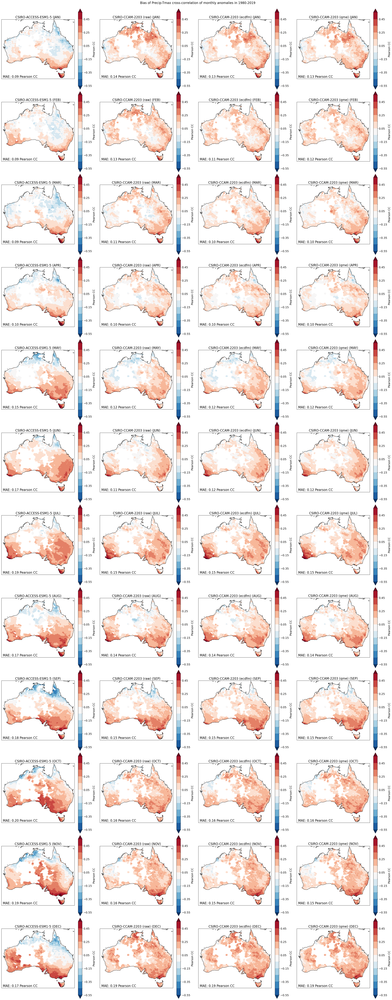

In [15]:
plot_comparison('CSIRO-ACCESS-ESM1-5', 'CSIRO-CCAM-2203', 'historical', cmap, levels)

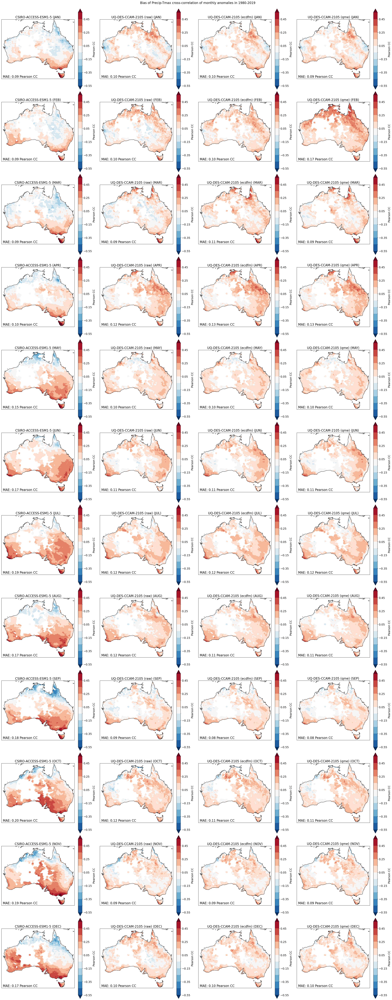

In [46]:
plot_comparison('CSIRO-ACCESS-ESM1-5', 'UQ-DES-CCAM-2105', 'historical', cmap, levels)

# task-xvalidation

### ERA5
Bias corrected data for the 2000-2019 period, using 1980-1999 as a training period.

In [ ]:
plot_comparison('ECMWF-ERA5', 'BOM-BARPA-R', 'xvalidation', cmap, levels)

In [ ]:
plot_comparison('ECMWF-ERA5', 'CSIRO-CCAM-2203', 'xvalidation', cmap, levels)

In [ ]:
plot_comparison('ECMWF-ERA5', 'UQ-DES-CCAM-2105', 'xvalidation', cmap, levels)

### ACCESS-ESM1-5
Bias corrected data for the 1990-2019 period, using 1960-1989 as a training period.

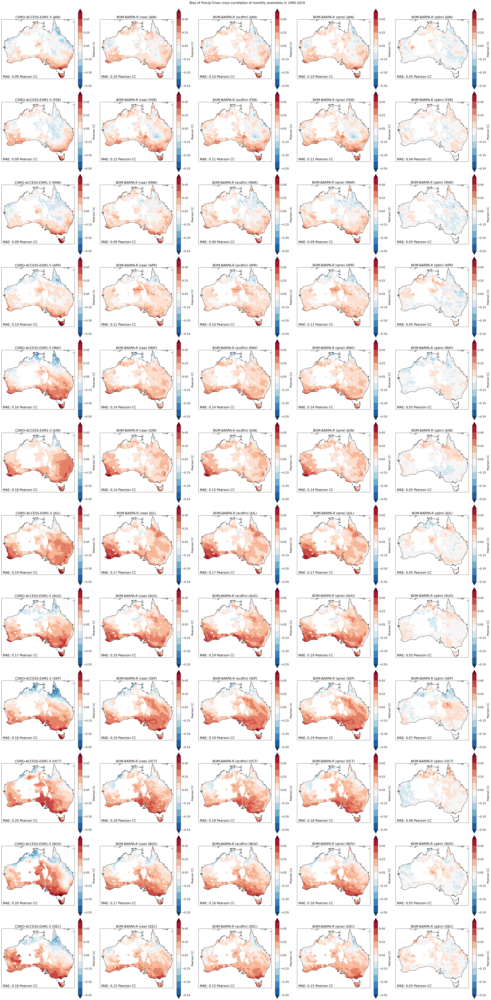

In [7]:
plot_comparison('CSIRO-ACCESS-ESM1-5', 'BOM-BARPA-R', 'xvalidation', cmap, levels)

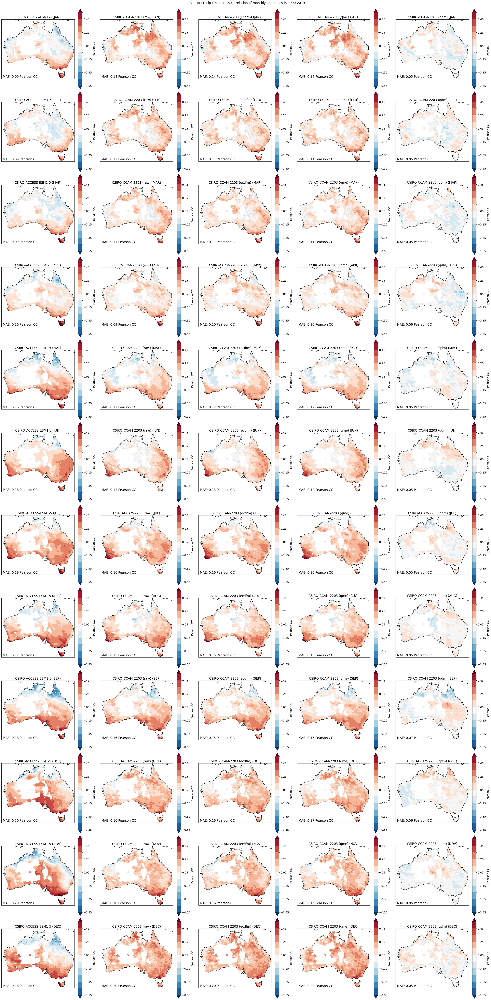

In [8]:
plot_comparison('CSIRO-ACCESS-ESM1-5', 'CSIRO-CCAM-2203', 'xvalidation', cmap, levels)

In [ ]:
plot_comparison('CSIRO-ACCESS-ESM1-5', 'UQ-DES-CCAM-2105', 'xvalidation', cmap, levels)